In [3]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap
%matplotlib inline

import seaborn as sns

from IPython.core.pylabtools import figsize
from IPython.display import HTML
from itertools import product

import hiplot as hip

plt.rcParams['axes.facecolor'] = '#eeeeee'
plt.rcParams['axes.edgecolor'] = '#bcbcbc'
# plt.rcParams['axes.grid'] = True
plt.rcParams['grid.linestyle'] = ':'
plt.rcParams['grid.linewidth'] = 0.5
plt.rcParams['grid.alpha'] = 1
plt.rcParams['grid.color'] = 'black'
plt.rcParams['legend.fancybox'] = True
# plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10

# Load data

In [4]:
data = pd.read_csv('../data/data.csv', index_col=0)
data.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


In [5]:
stores = pd.read_csv('../data/stores.csv', index_col=0)
stores.head()

,city,state,type,cluster
store_nbr,,,,
1,Quito,Pichincha,D,13
2,Quito,Pichincha,D,13
3,Quito,Pichincha,D,8
4,Quito,Pichincha,D,9
5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [6]:
holidays = pd.read_csv('../data/holidays_events.csv')
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [7]:
transactions = pd.read_csv('../data/transactions.csv')
display(transactions.head())

print('NULL values')
display(transactions.isnull().sum())
# len(transactions['store_nbr'].unique())

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


NULL values


date            0
store_nbr       0
transactions    0
dtype: int64

# Map

In [8]:
ecuador_cities = {
    'Quito': (-0.2295, -78.5243),
    'Guayaquil': (-2.1708, -79.9224),
    'Cuenca': (-2.9049, -79.0115),
    'Santo Domingo': (-0.2530, -79.1757),
    'Manta': (-0.9677, -80.7086),
    'Latacunga': (-0.9329, -78.6149),
    'Machala': (-3.2583, -79.9558),
    'Ambato': (-1.2491, -78.6168),
    'Quevedo': (-1.0333, -79.4496),
    'Esmeraldas': (0.9682, -79.6512),
    'Loja': (-3.9942, -79.2047),
    'Libertad': (-2.2356, -80.9367),
    'Playas': (-2.6286, -80.3833),
    'Daule': (-1.8531, -79.9788),
    'Babahoyo': (-1.8028, -79.5344),
    'Salinas': (-2.2167, -80.9667),
    'Puyo': (-1.4924, -77.9960),
    'Guaranda': (-1.5964, -79.0000),
    'Ibarra': (0.3392, -78.1220),
    'Riobamba': (-1.6636, -78.6546),
    'Cayambe': (0.0414, -78.1420),
    'El Carmen': (-0.2675, -79.4327)
}

ecuador_cities_df = pd.DataFrame({
    'lon': [lon for lat, lon in ecuador_cities.values()],
    'lat': [lat for lat, lon in ecuador_cities.values()],
    'name': list(ecuador_cities.keys()),
   #  'value': ['' for _ in range(len(ecuador_cities))]  # Filling with empty strings as in the provided example
}, dtype=str)

In [9]:
import folium

m = folium.Map(location=[-1.4449346800550638, -78.42582519208678], tiles="OpenStreetMap", zoom_start=7)
folium.GeoJson(
    data=(open('equador.geojson', 'r').read()), 
    name="Equador",
    style_function=lambda x: {'color': 'grey', 'weight': 2, 'fillColor': 'blue', 'fillOpacity': 0.1}
    ).add_to(m)
for i in range(0,len(ecuador_cities_df)):
   folium.Marker(
      location=[ecuador_cities_df.iloc[i]['lat'], ecuador_cities_df.iloc[i]['lon']],
      popup=ecuador_cities_df.iloc[i]['name'],
   ).add_to(m)
m

FileNotFoundError: [Errno 2] No such file or directory: 'equador.geojson'

# Stores metadata

In [ ]:
for f in ('state', 'city', 'type', 'cluster'):
    df_ = stores[f].value_counts()
    display(df_, len(df_))
    # plt.subplot()
    # df_.plot(kind='bar', figsize=(6, 2), title=f'#Stores - {f}')
    # plt.show()

state
Pichincha                         19
Guayas                            11
Santo Domingo de los Tsachilas     3
Azuay                              3
Manabi                             3
Cotopaxi                           2
Tungurahua                         2
Los Rios                           2
El Oro                             2
Chimborazo                         1
Imbabura                           1
Bolivar                            1
Pastaza                            1
Santa Elena                        1
Loja                               1
Esmeraldas                         1
Name: count, dtype: int64

16

city
Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: count, dtype: int64

22

type
D    18
C    15
A     9
B     8
E     4
Name: count, dtype: int64

5

cluster
3     7
6     6
10    6
15    5
13    4
14    4
11    3
4     3
8     3
1     3
9     2
7     2
2     2
12    1
5     1
16    1
17    1
Name: count, dtype: int64

17

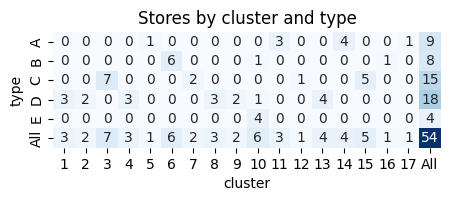

In [ ]:
x, y = 'cluster', 'type'
q = stores.reset_index().pivot_table(values='store_nbr', index=x, columns=y, aggfunc='count', fill_value=0, margins=True).T
# display(q)

fig, ax = plt.subplots(figsize=(5, 1.5))
sns.heatmap(q, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
ax.set_title(f'Stores by {x} and {y}', fontsize=12)
plt.show()

# Stores lifetime

In [ ]:
q = data.copy()
q = q.pivot_table(values='sales', index=['store_nbr', 'date'], aggfunc=lambda x: int(sum(x)>0))
q.reset_index(inplace=True)
q = q[q['sales']>0]
q = q.groupby(by='store_nbr').agg({'date': ['min', 'max'], 'sales': 'sum'})

q.columns = q.columns.map('_'.join)  # q.columns.droplevel(0)
q.rename(columns={'date_min': 'date_start', 'date_max': 'date_end', 'sales_sum': 'days_in_operation'}, inplace=True)
q['date_start'] = pd.to_datetime(q['date_start'])
q['date_end'] = pd.to_datetime(q['date_end'])
q['days_total'] = (q['date_end'] - q['date_start']).apply(lambda d: d.days + 1)
q['in_operation'] = q['days_in_operation'] / q['days_total']
q['days_total_of_all'] = q['days_total'] / q['days_total'].max()
# q.sort_values(by='days_total_of_all').head()
q.tail()

,date_start,date_end,days_in_operation,days_total,in_operation,days_total_of_all
store_nbr,,,,,,
50,2013-01-02,2017-08-15,1679,1687,0.995258,0.999408
51,2013-01-02,2017-08-15,1679,1687,0.995258,0.999408
52,2017-04-20,2017-08-15,118,118,1.000000,0.069905
53,2014-05-29,2017-08-15,1169,1175,0.994894,0.696090
54,2013-01-02,2017-08-15,1679,1687,0.995258,0.999408


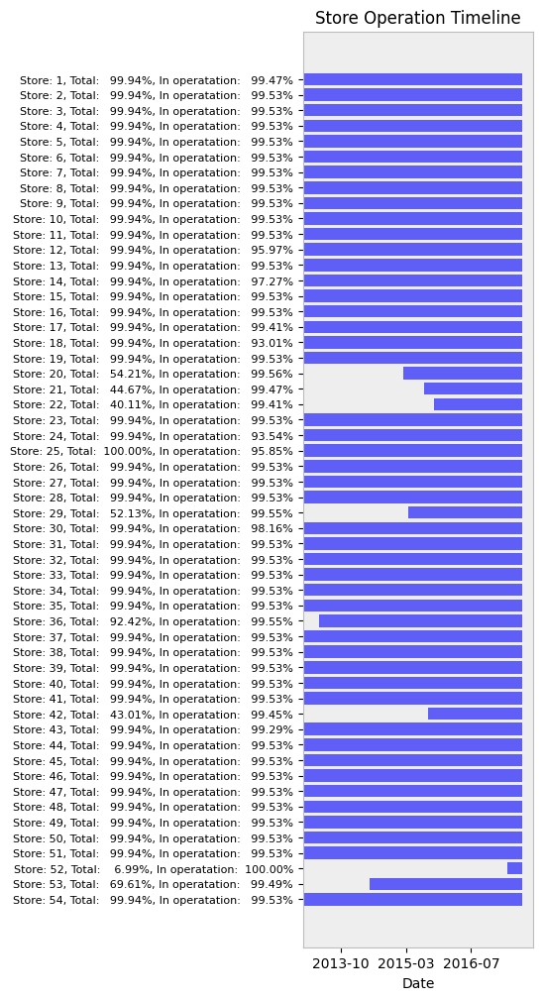

In [ ]:
q = q.sort_values(by='store_nbr')

fig, ax = plt.subplots(figsize=(3, 12))
ax.barh(q.index, q['days_total'], left=q['date_start'], color='blue', alpha=0.6)

ax.set_yticks(q.index)
y_ticks = 'Store: ' + pd.Series(q.index, index=q.index).apply(str)+', Total: ' + q['days_total_of_all'].apply(lambda x: f"{x:8.2%}") + ', In operatation: '+q['in_operation'].apply(lambda x: f"{x:8.2%}")
ax.set_yticklabels(y_ticks, fontsize=8)
ax.set_xlabel('Date')
ax.set_title('Store Operation Timeline')
ax.invert_yaxis()  # Display stores from top to bottom
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.show()

# Transactions by Store Type

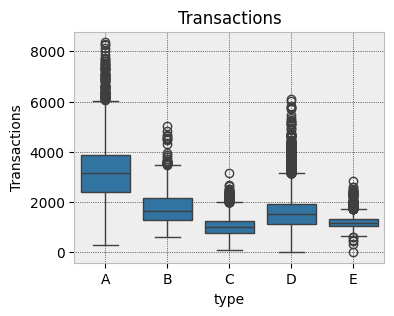

In [ ]:
q = transactions.copy()
q['date'] = pd.to_datetime(q['date'])
q['weekday'] = q['date'].dt.weekday+1
# display(q.head())

# add store metadata
q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')

# display(q.head())

# display(q.pivot_table(values='transactions', index=['type'], aggfunc=np.mean))

fig, ax = plt.subplots(figsize=(4, 3))
sns.boxplot(x="type", y="transactions", order=sorted(q['type'].unique()), data=q, ax=ax)  # hue='type'
# ax.legend(loc="upper right", title="Type", bbox_to_anchor=(0.97, 1.1))

ax.set_title(f'Transactions')
# ax.set_xlabel('Date')
ax.set_ylabel('Transactions')
ax.grid(True)

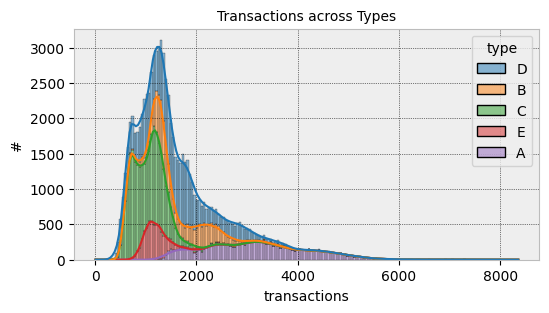

In [ ]:
q = transactions.copy()
q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')

# q = q.pivot_table(values='transactions', index=['store'], columns=['cluster'], aggfunc=np.mean)

# display(q.head())

fig, ax = plt.subplots(figsize=(6, 3))
sns.histplot(data=q, x='transactions', hue='type', multiple='stack', kde=True)
ax.set_title(f'Transactions across Types', fontsize=10)
# ax.set_xlabel('Date')
ax.set_ylabel('#')
ax.grid(True)

# Transactions weekly patterns

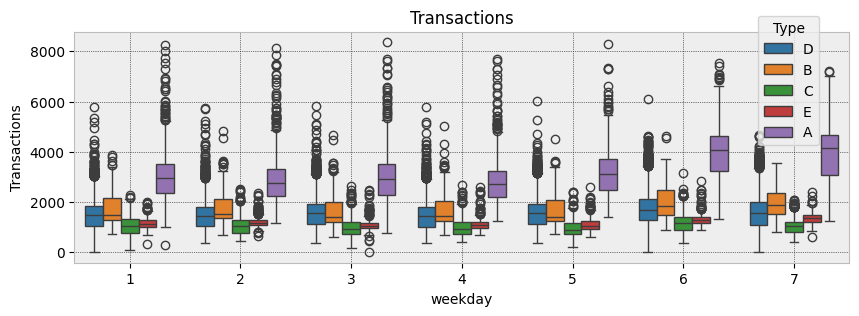

In [ ]:
q = transactions.copy()
q['date'] = pd.to_datetime(q['date'])
q['weekday'] = q['date'].dt.weekday+1
# q = q.pivot_table(values='sales', index=['store_nbr'], columns=['weekday'], aggfunc=np.mean)

# display(q.head())

# add store metadata
q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')

# display(q.head())

fig, ax = plt.subplots(figsize=(10, 3))
sns.boxplot(x="weekday", y="transactions", hue="type", data=q, ax=ax)
ax.legend(loc="upper right", title="Type", bbox_to_anchor=(0.97, 1.1))

ax.set_title(f'Transactions')
# ax.set_xlabel('Date')
ax.set_ylabel('Transactions')
ax.grid(True)


# Transactions over time + weekly pattern

/home/uselessskills/pyenv-ds/lib/python3.10/site-packages/matplotlib/colors.py:1304: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/home/uselessskills/pyenv-ds/lib/python3.10/site-packages/matplotlib/colors.py:1311: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)
/home/uselessskills/pyenv-ds/lib/python3.10/site-packages/matplotlib/ticker.py:521: UserWarning: Warning: converting a masked element to nan.
  if self._useLocale else fmt % arg)


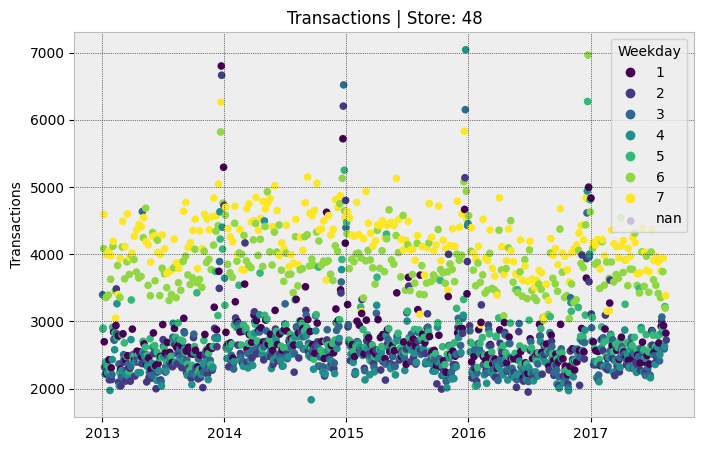

In [ ]:
q = transactions.copy()

# + store metadata
# q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')


q['date'] = pd.to_datetime(q['date'])
# q['month'] = q['date'].dt.month
# q['week'] = q['date'].dt.isocalendar().week
# q['year'] = q['date'].dt.year
# q['weekday'] = q['date'].dt.weekday+1

q = q.pivot_table(values='transactions', index=['date'], columns=['store_nbr']).reset_index()
# q.drop(columns=['store_nbr'], inplace=True)

q['weekday'] = q['date'].dt.dayofweek+1 #day_name()

# display(q.head())

fig, ax = plt.subplots(figsize=(8, 5))

# q.plot.scatter(x='date', y=1, color='b', ax=ax)
# p = q.plot.scatter(x='date', y=1, c=q['weekday'], ax=ax, colormap='viridis', colorbar=True)

# cmap = ListedColormap(['#1f78b4', '#33a02c', '#e31a1c', '#ff7f00', '#6a3d9a', '#a6cee3', '#fdbf6f'])

store_nbr = 48  # 1, 17, 27, 48
p = ax.scatter(x=q['date'], y=q[store_nbr], c=q['weekday'], s=20) 
legend1 = ax.legend(*p.legend_elements(), loc="upper right", title="Weekday", bbox_to_anchor=(1, 1))
# ax.add_artist(legend1)

# q[store_nbr].plot(x='date', y='transactions', marker='o', linestyle='-', ax=ax)

# ax.legend(True)
ax.set_title(f'Transactions | Store: {store_nbr}')
# ax.set_xlabel('Date')
ax.set_ylabel('Transactions')
ax.grid(True)

# fig.tight_layout(rect=[0, 0, 1, 1])

# Products yearly seasonality

In [ ]:
data['family'].unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

,date,store_nbr,family,sales
0,2013-01-01,1,AUTOMOTIVE,0.000000
1,2013-01-02,1,AUTOMOTIVE,0.105263
2,2013-01-03,1,AUTOMOTIVE,0.157895
3,2013-01-04,1,AUTOMOTIVE,0.157895
4,2013-01-05,1,AUTOMOTIVE,0.263158


3000888

,date,store_nbr,family,sales,month
2611884,2013-01-01,48,AUTOMOTIVE,0.000000,1
2611885,2013-01-02,48,AUTOMOTIVE,0.092593,1
2611886,2013-01-03,48,AUTOMOTIVE,0.055556,1
2611887,2013-01-04,48,AUTOMOTIVE,0.018519,1
2611888,2013-01-05,48,AUTOMOTIVE,0.111111,1


11788

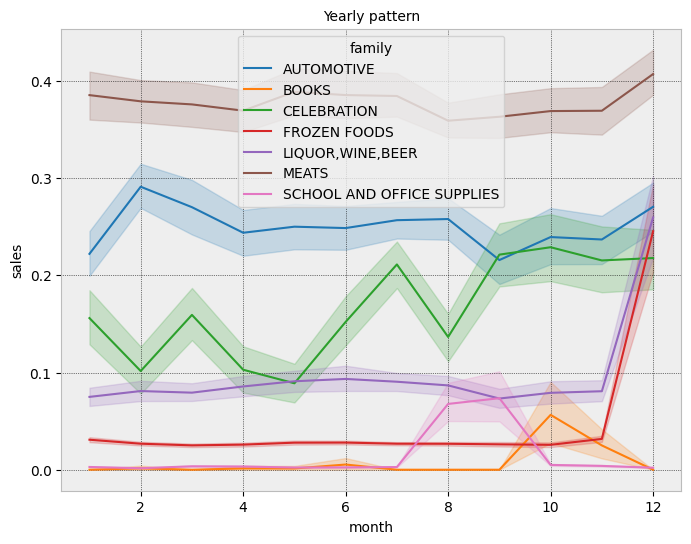

In [ ]:
q = data.copy()
q['date'] = pd.to_datetime(q['date'])
# q['month'] = q['date'].dt.month
# q['week'] = q['date'].dt.isocalendar().week
# q['weekday'] = q['date'].dt.weekday
# q = q.pivot_table(values='sales', index=['store_nbr', 'family'], columns=['weekday'], aggfunc=np.mean)

# normalize 0-1 each product family
q = q.pivot_table(values='sales', index=['date'], columns=['store_nbr', 'family'], aggfunc=np.mean)
q = q/q.max().values  # normalized to 0-1

# unpivot
q = q.reset_index()
q = pd.melt(q, id_vars='date', var_name=['store_nbr', 'family'], value_name='sales')
display(q.head(), len(q))

# q['weekday'] = q['date'].dt.weekday
q['month'] = q['date'].dt.month

# q = q.pivot_table(values='sales', index=['store_nbr', 'month'], columns=['family'], aggfunc=np.mean)
# q.reset_index(inplace=True)

store_nbr = 48
q = q[q['store_nbr']==store_nbr]
q = q[q['family'].isin(['AUTOMOTIVE', 'BOOKS', 'CELEBRATION', 'MEATS', 'LIQUOR,WINE,BEER', 'SCHOOL AND OFFICE SUPPLIES', 'FROZEN FOODS'])]
display(q.head(), len(q))

fig, ax = plt.subplots(figsize=(8, 6))
sns.lineplot(x="month", y="sales", hue="family", data=q, ax=ax)
ax.set_title(f'Yearly pattern', fontsize=10)
# ax.set_yticks(q.index)
# y_ticks = 'Store: ' + pd.Series(q.index, index=q.index).apply(str)+', Total: ' + q['days_total_of_all'].apply(lambda x: f"{x:8.2%}") + ', In operatation: '+q['in_operation'].apply(lambda x: f"{x:8.2%}")
# ax.set_yticklabels(y_ticks, fontsize=8)
ax.grid(True)

# sns.jointplot(x=q['family'], y=q['month'], kind="hex", color="#4CB391")

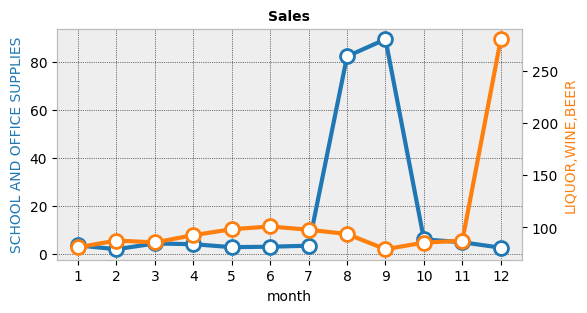

In [ ]:
q = data.copy()
q['date'] = pd.to_datetime(q['date'])
q['month'] = q['date'].dt.month

store_nbr = 48
q = q[q['store_nbr']==store_nbr]
# q = q[q['family'].isin(['SCHOOL AND OFFICE SUPPLIES', 'CELEBRATION'])]

# q.set_index('date', inplace=True)
# display(q.head(), len(q))

q = q.pivot_table(values='sales', index=['month'], columns=['family'], aggfunc=np.mean)
# q.reset_index(inplace=True)
# display(q.head(), len(q))

fig, ax = plt.subplots(figsize=(6, 3))

style_params = dict(marker='o', markersize=10, markerfacecolor='white', markeredgecolor='#1f77b4', markeredgewidth=2, linestyle='-', linewidth=3, color='#1f77b4')
f = 'SCHOOL AND OFFICE SUPPLIES' # 'BEVERAGES' #'SCHOOL AND OFFICE SUPPLIES' #'BREAD/BAKERY'
q[f].plot(x='month', y='sales', **style_params, label=f, ax=ax)
ax.set_ylabel(f, color='#1f77b4')

ax2 = ax.twinx()
style_params = dict(marker='o', markersize=10, markerfacecolor='white', markeredgecolor='#ff7f0e', markeredgewidth=2, linestyle='-', linewidth=3, color='#ff7f0e')
f = 'LIQUOR,WINE,BEER' # 'CELEBRATION' #'LIQUOR,WINE,BEER'
q[f].plot(x='month', y='sales', **style_params, label=f, ax=ax2)
ax2.set_ylabel(f, color='#ff7f0e')


# Show each observation with a scatterplot
# sns.stripplot(
#     data=q, x="month", y="sales", hue="family",
#     dodge=True, alpha=.25, zorder=1, legend=False, ax=ax
# )

# Show the conditional means, aligning each pointplot in the
# center of the strips by adjusting the width allotted to each
# category (.8 by default) by the number of hue levels
# sns.pointplot(
#     data=q, x="month", y="sales", hue="family",
#     dodge=.8 - .8 / 3, palette="dark", errorbar=None,
#     markers="d", markersize=4, linestyle="none", ax=ax
# )

# ax.legend(loc="upper right", bbox_to_anchor=(0.97, 1.1))
# ax2.legend(loc="upper right", bbox_to_anchor=(0.97, 1.1))
ax.set_title(f'Sales', fontsize=10, fontweight='bold', color='black')
ax.grid(True)
ax.set_xticks(q.index)

# Holidays

In [ ]:
q = holidays.copy()
# q = q.pivot_table(values='date', index=['description'], columns=['date'], aggfunc='count')
# q = q['description'].value_counts()

q = q.groupby('description')['date'].agg(['count', list]).reset_index()

print(len(q))
# display(q.sort_values('count', ascending=False).head(10))
HTML(q.sort_values('count', ascending=False).head(10).to_html())

103


,description,count,list
11,Carnaval,10,"[2013-02-11, 2013-02-12, 2014-03-03, 2014-03-04, 2015-02-16, 2015-02-17, 2016-02-08, 2016-02-09, 2017-02-27, 2017-02-28]"
18,Fundacion de Cuenca,7,"[2012-04-12, 2013-04-12, 2014-04-12, 2015-04-12, 2016-04-12, 2017-04-12, 2017-04-13]"
22,Fundacion de Ibarra,7,"[2012-09-28, 2013-09-28, 2014-09-28, 2015-09-28, 2016-09-28, 2017-09-28, 2017-09-29]"
45,Navidad+1,6,"[2012-12-26, 2013-12-26, 2014-12-26, 2015-12-26, 2016-12-26, 2017-12-26]"
44,Navidad,6,"[2012-12-25, 2013-12-25, 2014-12-25, 2015-12-25, 2016-12-25, 2017-12-25]"
23,Fundacion de Loja,6,"[2012-12-08, 2013-12-08, 2014-12-08, 2015-12-08, 2016-12-08, 2017-12-08]"
24,Fundacion de Machala,6,"[2012-06-25, 2013-06-25, 2014-06-25, 2015-06-25, 2016-06-25, 2017-06-25]"
25,Fundacion de Manta,6,"[2012-03-02, 2013-03-02, 2014-03-02, 2015-03-02, 2016-03-02, 2017-03-02]"
26,Fundacion de Quito,6,"[2012-12-06, 2013-12-06, 2014-12-06, 2015-12-06, 2016-12-06, 2017-12-06]"
27,Fundacion de Quito-1,6,"[2012-12-05, 2013-12-05, 2014-12-05, 2015-12-05, 2016-12-05, 2017-12-05]"


In [ ]:
q = holidays.copy()

print(len(q))
q = q.groupby('date')['type'].agg(['count', list]).reset_index()
print(len(q))

q['list'] = q['list'].apply(lambda x: '.'.join(map(str, list(set(x)))))
q.rename(columns={'list': 'holiday'}, inplace=True)

display(q.sort_values('count', ascending=False).head(20))

350
312


,date,count,holiday
99,2014-06-25,4,Holiday.Event
282,2017-06-25,3,Holiday
232,2016-06-25,3,Holiday
159,2015-06-25,3,Holiday
51,2013-06-25,3,Holiday
7,2012-06-25,3,Holiday
140,2014-12-26,2,Additional.Bridge
184,2015-12-22,2,Holiday.Additional
29,2012-12-22,2,Holiday.Additional
31,2012-12-24,2,Additional.Bridge


# Hiplot

## Transaction seasonality

In [ ]:
q = transactions.copy()

# + store metadata
q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')

q['date'] = pd.to_datetime(q['date'])
q['month'] = q['date'].dt.month
q['week'] = q['date'].dt.isocalendar().week
q['year'] = q['date'].dt.year
q['weekday'] = q['date'].dt.weekday+1

# q = q.pivot_table(values='transactions', index=['type'], columns=['weekday'], aggfunc=np.mean)
# display(q.head())

q = q.pivot_table(values='transactions', index=['type', 'cluster', 'store_nbr', 'year', 'week'], columns=['weekday'], aggfunc=np.mean)
q.reset_index(inplace=True)
display(q.head())

weekday,type,cluster,store_nbr,year,week,1,2,3,4,5,6,7
0,A,5,44,2013,1,5810.0,5085.0,4821.0,3618.0,4169.0,4921.0,4925.0
1,A,5,44,2013,2,3871.0,3593.0,4006.0,3323.0,3873.0,4423.0,4676.0
2,A,5,44,2013,3,3450.0,3527.0,4026.0,3412.0,3801.0,4656.0,4732.0
3,A,5,44,2013,4,3508.0,3349.0,3704.0,3121.0,3751.0,4812.0,4648.0
4,A,5,44,2013,5,3392.0,3317.0,3852.0,3509.0,4064.0,5166.0,4736.0


In [ ]:
xp = hip.Experiment.from_dataframe(q)
xp.display_data(hip.Displays.PARALLEL_PLOT).update({
    'order': list(range(7, 0, -1)),
})
xp.display_data(hip.Displays.TABLE).update({
    'hide': ['uid', 'from_uid'],
    # 'order_by': [['imdb']],
    # 'order': ['title'],
})
xp.display()

<IPython.core.display.Javascript object>

## Sales

In [ ]:
q = data.copy()

# normalize 0-1 each product family
q = q.pivot_table(values='sales', index=['date'], columns=['store_nbr', 'family'], aggfunc=np.mean)
q = q/q.max().values  # normalized to 0-1

# unpivot
q = q.reset_index()
q = pd.melt(q, id_vars='date', var_name=['store_nbr', 'family'], value_name='sales')
print(q.shape)

# add attributes
q = pd.merge(q, stores.reset_index(), on='store_nbr', how='inner')
print(q.shape)

# add holidays
h = holidays.copy()
h = h.groupby('date')['type'].agg(['count', list]).reset_index()
h['list'] = h['list'].apply(lambda x: '.'.join(map(str, list(set(x)))))
h.rename(columns={'list': 'holiday'}, inplace=True)

q = pd.merge(q, h, on='date', how='left')
q['holiday'].fillna('-', inplace=True)
print(q.shape)
# display(q.head())

q['date'] = pd.to_datetime(q['date'])
q['month'] = q['date'].dt.month
q['week'] = q['date'].dt.isocalendar().week
q['year'] = q['date'].dt.year
q['weekday'] = q['date'].dt.day_name()  #.weekday+1

q = q.pivot_table(values='sales', index=['type', 'store_nbr', 'month', 'week', 'family'], columns=['weekday'], aggfunc=np.sum)
# display(q.head())
    
q.reset_index(inplace=True)
# display(q.head())
print(q.shape)

# display(q['holiday'].value_counts())

(3000888, 4)
(3000888, 8)
(3000888, 10)
(130086, 12)


In [ ]:
xp = hip.Experiment.from_dataframe(q.iloc[:10000])
xp.display_data(hip.Displays.PARALLEL_PLOT).update({
    'order': [
        'store_nbr', 'family', 
        'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'][::-1],
})
xp.display_data(hip.Displays.TABLE).update({
    'hide': ['uid', 'from_uid'],
    # 'order_by': [['imdb']],
    # 'order': ['title'],
})
xp.display()

<IPython.core.display.Javascript object>